In [1]:
using Plots

In [3]:
abstract type AbstractElement end

function potential(element::AbstractElement, x, y)
    element.parameter * potinf(element, x, y)
end

# ------------------------------------------------------------------------------

mutable struct Model
    kD::AbstractFloat
    elements::Array{AbstractElement}
end

function add!(model::Model, element::AbstractElement)
    push!(model.elements, element)
end

function head(model::Model, x, y)
    return sum(potential(e, x, y) for e in model.elements) / model.kD
end

function solve!(model::Model)
    unknown_elements = filter(e -> e.has_unknown, model.elements)
    unknowns = length(unknown_elements)
    if unknowns > 0
        matrix = zeros(unknowns, unknowns)
        rhsvec = zeros(unknowns)

        for (i,e) in enumerate(unknown_elements)
            row, rhs = equation(model, e, unknowns)
            matrix[i, :] = row
            rhsvec[i] = rhs
            to_solve = true
        end

        solution = matrix \ rhsvec
        for (e, p) in zip(filter(e -> e.has_unknown, model.elements), solution)
            e.parameter = p
        end
    end
end

# ------------------------------------------------------------------------------

mutable struct Well <: AbstractElement
    x::AbstractFloat
    y::AbstractFloat
    parameter::AbstractFloat # q
    r::AbstractFloat
    has_unknown::Bool
end

function potinf(well::Well, x, y)
    rsq = (x - well.x)^2 + (y -  well.y)^2
    if rsq < well.r^2
        rsq = well.r^2
    end
    return 1/(4π) * log(rsq)
end

# ------------------------------------------------------------------------------

mutable struct UniformFlow <: AbstractElement
    parameter::AbstractFloat # gradient
    angle::Real
    has_unknown::Bool
end

function potinf(uflow::UniformFlow, x, y)
    angle = uflow.angle * π/180.0
    -x * cos(angle) - y * sin(angle)
end

# ------------------------------------------------------------------------------

abstract type HeadElement <: AbstractElement end

function equation(model::Model, element::HeadElement, unknowns::Integer)
    row = zeros(unknowns)
    rhs = element.pc
    i = 1
    for e in model.elements
        if e.has_unknown
             row[i] = potinf(e, element.x, element.y)
             i += 1
        else
            rhs -= potential(e, element.x, element.y)
        end
    end
    return row, rhs
end

# ------------------------------------------------------------------------------

mutable struct HeadWell <: HeadElement
    x::AbstractFloat
    y::AbstractFloat
    head::AbstractFloat
    r::AbstractFloat
    has_unknown::Bool
    pc::AbstractFloat
    parameter::AbstractFloat
end

function potinf(well:: HeadWell, x, y)
    rsq = (x - well.x)^2 + (y -  well.y)^2
    if rsq < well.r^2
        rsq = well.r^2
    end
    return 1/(4π) * log(rsq)
end

# ------------------------------------------------------------------------------

mutable struct ConstantHead <: HeadElement
    x::AbstractFloat
    y::AbstractFloat
    head::AbstractFloat
    has_unknown::Bool
    pc::AbstractFloat
    parameter::AbstractFloat
end

function potinf(constant_head::ConstantHead, x, y)
    return 1.0
end

potinf (generic function with 5 methods)

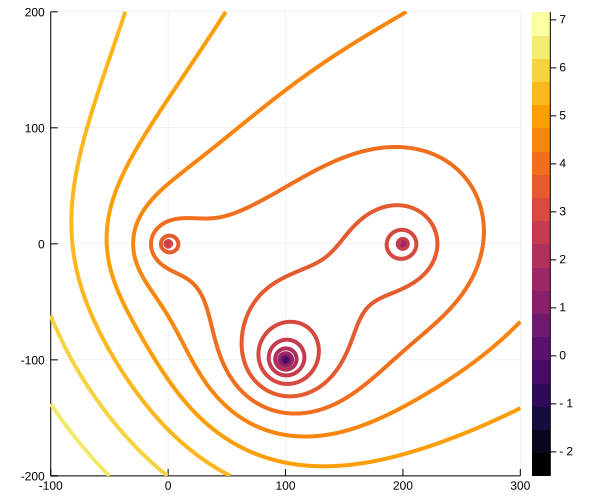

In [4]:
ml = Model(200.0, [])
w1 = Well(0.0, 0.0, 600.0, 0.1, false)
w2 = Well(200.0, 0.0, 600.0, 0.1, false)
uflow = UniformFlow(1.1, 45, false)
ref = ConstantHead(0.0, 100.0, 5.0, true, ml.kD * 5.0, 0.0)
hw = HeadWell(100.0, -100.0, -2.5, 0.1, true, ml.kD * -2.5, 0.0)

add!(ml, w1)
add!(ml, w2)
add!(ml, uflow)
add!(ml, ref)
add!(ml, hw)
solve!(ml)

xs = -100.0:300.0
ys = -200.0:200.0
contour(xs, ys, (x,y) -> head(ml, x, y), nlevels=20, w=4, size=(600, 500))

In [5]:
using Interact

HTML{String}("    <script class='js-collapse-script'>\n        var curMatch =\n            window.location.href\n            .match(/(.*?)\\/notebooks\\/.*\\.ipynb/);\n\n        curMatch = curMatch ||\n            window.location.href\n            .match(/(.*?)\\/apps\\/.*\\.ipynb/);\n\n        if ( curMatch ) {\n            \$('head').append('<base href=\"' + curMatch[1] + '/\">');\n        }\n    </script>\n")

HTML{String}("<script class='js-collapse-script' src='/assetserver/bba0e629e9bd7c683baecc87f2dd90ca18095dad-assets/webio/dist/bundle.js'></script>")

HTML{String}("<script class='js-collapse-script' src='/assetserver/bba0e629e9bd7c683baecc87f2dd90ca18095dad-assets/providers/ijulia_setup.js'></script>")

HTML{String}("  <script class='js-collapse-script'>\n    \$('.js-collapse-script').parent('.output_subarea').css('padding', '0');\n  </script>\n")

In [32]:
xs = range(-100.0, stop=300.0, step=5.0)
ys = range(-200.0, stop=200.0, step=5.0)

@manipulate for q = range(100.0, stop=1000.0,step=10.0)
    ml.elements[1].parameter = q
    contour(xs, ys, (x,y) -> head(ml, x, y), nlevels=20, w=4, size=(600, 500))
end

Widget{:manipulate,Any}(OrderedDict{Symbol,Any}(:q=>Widget{:slider,Float64}(OrderedDict{Symbol,Any}(:changes=>Observable{Int64}("ob_53", 0, Any[SyncCallback(Scope("knockout-component-1d8abec8-e218-4a65-85b1-0857fa70a4df", Node{DOM}(DOM(:html, :div), Any[Node{DOM}(DOM(:html, :div), Any[Node{DOM}(DOM(:html, :label), Any["q"], Dict{Symbol,Any}(:className=>"interact ",:style=>Dict{Any,Any}(:padding=>"5px 10px 0px 10px")), 1)], Dict{Symbol,Any}(:attributes=>Dict("style"=>"text-align:right;width:18%")), 2), Node{DOM}(DOM(:html, :div), Any[Node{DOM}(DOM(:html, :input), Any[], Dict{Symbol,Any}(:max=>1000.0,:min=>100.0,:attributes=>Dict{Any,Any}(:type=>"range",Symbol("data-bind")=>"numericValue: value, valueUpdate: 'input', event: {change : function () {this.changes(this.changes()+1)}}"),:step=>10.0,:className=>"slider slider is-fullwidth",:style=>Dict{Any,Any}()), 0)], Dict{Symbol,Any}(:attributes=>Dict("style"=>"flex-grow:1; margin: 0 2%")), 1), Node{DOM}(DOM(:html, :div), Any[Node{DOM}(DOM(:html, :p), Any[], Dict{Symbol,Any}(:attributes=>Dict("data-bind"=>"text: displayedvalue")), 0)], Dict{Symbol,Any}(:attributes=>Dict("style"=>"width:18%")), 1)], Dict{Symbol,Any}(:attributes=>Dict("style"=>"display:flex; justify-content:center; align-items:center;")), 7), Dict{String,Tuple{Observables.AbstractObservable,Union{Nothing, Bool}}}("changes"=>(Observable{Int64}(#= circular reference @-6 =#), nothing),"value"=>(Observable{Float64}("ob_52", 550.0, Any[SyncCallback(Scope(#= circular reference @-6 =#), SyncCallback(Scope(#= circular reference @-7 =#), ##39#41{Scope,String}(Scope(#= circular reference @-8 =#), "value"))), #g#15{##16#17{##105#108,Observable{Any}},Tuple{Observable{Float64}}}(##16#17{##105#108,Observable{Any}}(##105#108(), Observable{Any}("ob_54", Plot{Plots.GRBackend() n=1}, Any[])), (Observable{Float64}(#= circular reference @-4 =#),))]), nothing)), Set(String[]), nothing, Any["knockout"=>"/home/huite/.julia/packages/Knockout/JIqpG/src/../assets/knockout.js", "knockout_punches"=>"/home/huite/.julia/packages/Knockout/JIqpG/src/../assets/knockout_punches.js", "/home/huite/.julia/packages/InteractBase/I1FZ7/src/../assets/all.js", "/home/huite/.julia/packages/InteractBase/I1FZ7/src/../assets/style.css", "/home/huite/.julia/packages/InteractBulma/Ohu5Y/src/../assets/main.css"], Dict{Any,Any}("_promises"=>Dict{Any,Any}("importsLoaded"=>Any[JSString("function (ko, koPunches) {\n    ko.punches.enableAll();\n    ko.bindingHandlers.numericValue = {\n        init : function(element, valueAccessor, allBindings, data, context) {\n            var stringified = ko.observable(ko.unwrap(valueAccessor()));\n            stringified.subscribe(function(value) {\n                var val = parseFloat(value);\n                if (!isNaN(val)) {\n                    valueAccessor()(val);\n                }\n            })\n            valueAccessor().subscribe(function(value) {\n                var str = JSON.stringify(value);\n                if ((str == \"0\") && ([\"-0\", \"-0.\"].indexOf(stringified()) >= 0))\n                     return;\n                 if ([\"null\", \"\"].indexOf(str) >= 0)\n                     return;\n                stringified(str);\n            })\n            ko.applyBindingsToNode(element, { value: stringified, valueUpdate: allBindings.get('valueUpdate')}, context);\n        }\n    };\n    var json_data = JSON.parse(\"{\\\"changes\\\":0,\\\"value\\\":550.0}\");\n    var self = this;\n    function AppViewModel() {\n        for (var key in json_data) {\n            var el = json_data[key];\n            this[key] = Array.isArray(el) ? ko.observableArray(el) : ko.observable(el);\n        }\n        \n        [this[\"displayedvalue\"]=ko.computed(function () {return this.value().toPrecision(6);},this)]\n        [this[\"changes\"].subscribe((function (val){!(this.valueFromJulia[\"changes\"]) ? (WebIO.setval({\"name\":\"changes\",\"scope\":\"knockout-component-1d8abec8-e218-4a65-85b1-0857fa70a4df\",\"id\":\"ob_53\",\"type\"